### Imports

In [74]:
import numpy as np
import xarray as xr
import datashader as ds
import rasterio
import pandas as pd
from datashader.transfer_functions import shade

### Load Sentinel-2 Data 

The Sentinel 2 satellites have a Multi-Spectral Instrument (MSI) with 13 spectral bands that range from the visible range to the shortwave infrared (SWIR). Bands come in variable resolutions from 10 to 60 meter and their wavelenght is determined based on specific purposes. (https://www.hatarilabs.com/ih-en/how-many-spectral-bands-have-the-sentinel-2-images)

In [28]:
band_info = pd.DataFrame([
        ("01", "Coastal Aerosol",       " 20",    0.443,  "60",),
        ("02", "Blue",                  " 65",    0.490,  "10",),
        ("03", "Green",                 " 35",    0.560,  "10",),
        ("04", "Red",                   " 30",    0.665,  "10",),
        ("05", "Vegetation Red Edge",   " 15",    0.705,  "20",),
        ("06", "Vegetation Red Edge",   " 15",    0.740,  "20",),
        ("07", "Vegetation Red Edge",   " 20",    0.783,  "20",),
        ("08", "NIR",                   "115",    0.842,  "10",),
        ("8A", "Narrow NIR",            " 20",    0.865,  "20",),
        ("09", "Water vapour",          " 20",    0.945,  "60",),
        ("10", "SWIR - Cirrus",         " 20",    1.375,  "60",),
        ("11", "SWIR",                  " 90",    1.610,  "20",),
        ("12", "SWIR",                  "180",    2.190,  "20",)],
    columns=['Band Number', 'Name', 'Bandwidth (µm)', 'Nominal Wavelength (µm)', 'Resolution (m)'])

band_info

,Band Number,Name,Bandwidth (µm),Nominal Wavelength (µm),Resolution (m)
0,01,Coastal Aerosol,20,0.443,60
1,02,Blue,65,0.490,10
2,03,Green,35,0.560,10
3,04,Red,30,0.665,10
4,05,Vegetation Red Edge,15,0.705,20
5,06,Vegetation Red Edge,15,0.740,20
6,07,Vegetation Red Edge,20,0.783,20
7,08,NIR,115,0.842,10
8,8A,Narrow NIR,20,0.865,20
9,09,Water vapour,20,0.945,60


In [239]:
def convert_to_2d(agg):
    agg = agg.isel(band=0)
    agg = agg.drop_vars('band')
    nodata = agg.attrs['nodatavals'][0]
    agg.data[np.where(agg.data==nodata)] = np.nan
    return agg


def downsample(input_agg, sample_height=1000, sample_width=1000):
    # define a canvas for resampling
    canvas = ds.Canvas(plot_height=sample_height, plot_width=sample_width)
    # resample
    resampled_agg = canvas.raster(input_agg.astype(np.float), nan_value=np.nan)    
    
    # attributes of resampled raster remain the same as of input raster
    resampled_agg.attrs = input_agg.attrs
    
    # new resolution of resampled raster
    ycoords = input_agg.y.data
    xcoords = input_agg.x.data
    new_yres = (ycoords[0] - ycoords[-1]) / (sample_height - 1)
    new_xres = (xcoords[-1] - xcoords[0]) / (sample_width - 1)
    resampled_agg.attrs['res'] = (new_yres, new_xres)
    
    return resampled_agg


def get_data(file_path):
    # read data from a file_path
    agg = xr.open_rasterio(file_path).astype(np.float)
    # convert to 2D agg
    agg = convert_to_2d(agg)
    # downsample
    agg = downsample(agg)
    return agg
    
    
def combine(agg_grid):
    combined_agg = xr.combine_nested(agg_grid, concat_dim=['y', 'x']).chunk(1000, 1000)
    return combined_agg

In [ ]:
# data path
T27VXL = 'T27VXL'
T27VWL = 'T27VWL'
T27VVL = 'T27VVL'
T27WXM = 'T27WXM'
T27WWM = 'T27WWM'
T27WVM = 'T27WVM'

path_dict = {
    T27VXL: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27VXL_20210322T144902.SAFE/GRANULE/L1C_T27VXL_A030022_20210322T125300/IMG_DATA/T27VXL_20210322T125301_B%s.jp2',
    T27VWL: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27VWL_20210322T144902.SAFE/GRANULE/L1C_T27VWL_A030022_20210322T125300/IMG_DATA/T27VWL_20210322T125301_B%s.jp2',
    T27VVL: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27VVL_20210322T144902.SAFE/GRANULE/L1C_T27VVL_A030022_20210322T125300/IMG_DATA/T27VVL_20210322T125301_B%s.jp2',
    T27WXM: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27WXM_20210322T144902.SAFE/GRANULE/L1C_T27WXM_A030022_20210322T125300/IMG_DATA/T27WXM_20210322T125301_B%s.jp2',
    T27WWM: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27WWM_20210322T144902.SAFE/GRANULE/L1C_T27WWM_A030022_20210322T125300/IMG_DATA/T27WWM_20210322T125301_B%s.jp2',
    T27WVM: 'S2A_MSIL1C_20210322T125301_N0209_R138_T27WVM_20210322T144902.SAFE/GRANULE/L1C_T27WVM_A030022_20210322T125300/IMG_DATA/T27WVM_20210322T125301_B%s.jp2'
}

In [233]:
bands = list(band_info['Band Number'])
tile_idx = list(path_dict.keys())
bands, tile_idx

(['01',
  '02',
  '03',
  '04',
  '05',
  '06',
  '07',
  '08',
  '8A',
  '09',
  '10',
  '11',
  '12'],
 ['T27VXL', 'T27VWL', 'T27VVL', 'T27WXM', 'T27WWM', 'T27WVM'])

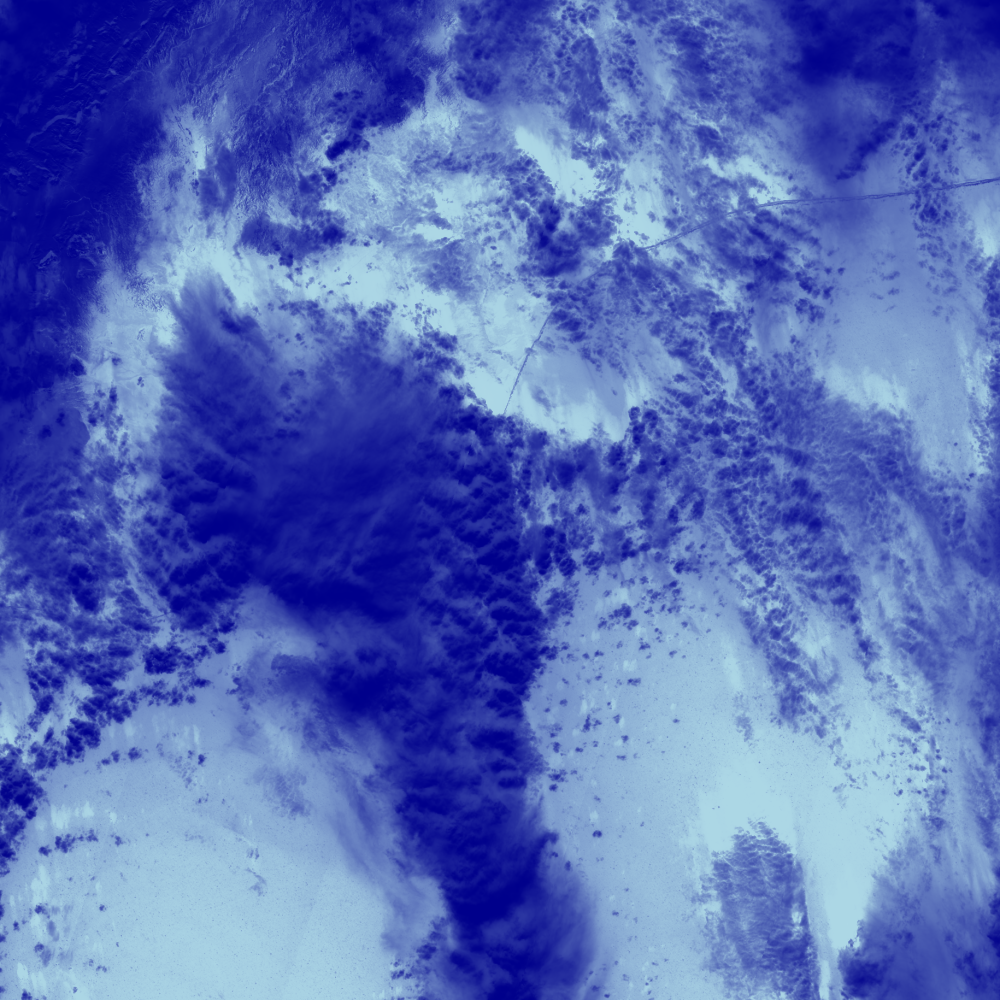

In [231]:
band_01 = '01'
tile_id = T27VXL
path_T27VXL_01 = path_dict[T27VXL]%band_01
agg_T27VXL_01 = get_data(path_T27VXL_01)
shade(agg_T27VXL_01)

In [235]:
# take some time to run

data_dict = {}
for band in bands:
    data_dict[band] = {}
    for tile_id in tile_idx:
        file_path = path_dict[tile_id]%band
        data_dict[band][tile_id] = get_data(file_path)
data_dict

{'01': {'T27VXL': <xarray.DataArray (y: 1000, x: 1000)>
  array([[5542.69112246, 5653.72274478, 5812.09922661, ..., 9870.47890352,
          9949.97599212, 9987.03896802],
         [5706.232763  , 5793.46731763, 5816.00755472, ..., 9667.19842336,
          9735.28358566, 9786.99650632],
         [5745.25677088, 5825.53608648, 5871.99157932, ..., 9425.6943474 ,
          9485.530622  , 9598.5483293 ],
         ...,
         [1820.70025979, 1680.04494013, 1669.77323897, ..., 4791.27071576,
          5037.44554928, 5370.82038878],
         [1797.97139359, 1691.90104213, 1648.46636209, ..., 4625.53351847,
          4907.56263251, 5322.53041297],
         [1675.61252949, 1654.89665263, 1632.39326346, ..., 4634.00901789,
          4851.80886261, 5338.11373884]])
  Coordinates:
    * x        (x) float64 6.001e+05 6.002e+05 6.003e+05 ... 7.096e+05 7.097e+05
    * y        (y) float64 7.1e+06 7.1e+06 7.1e+06 ... 6.991e+06 6.99e+06 6.99e+06
  Attributes:
      res:      60.0,
  'T27VWL': <xarra

In [43]:
xs = [tile.coords['x'] for tile in a[0]]
ys = [tile.coords['x'] for tile in a[1]]

import numpy as np
cutoff_pos = [(np.abs(xs[i-1].data-ys[i].data[0])).argmin() for i in range(1, 3)]
cutoff_pos

[1667, 1667]

## Combine tiles into one DataArray

In [247]:
grid = [[T27VVL, T27VWL, T27VXL],
        [T27WVM, T27WWM, T27WXM]]

In [253]:
band_01 = '01'
grid_01 = [[data_dict[band_01][T27WVM], data_dict[band_01][T27WWM], data_dict[band_01][T27WXM]],
           [data_dict[band_01][T27VVL], data_dict[band_01][T27VWL], data_dict[band_01][T27VXL]]]
combined_01 = combine(grid_01) 

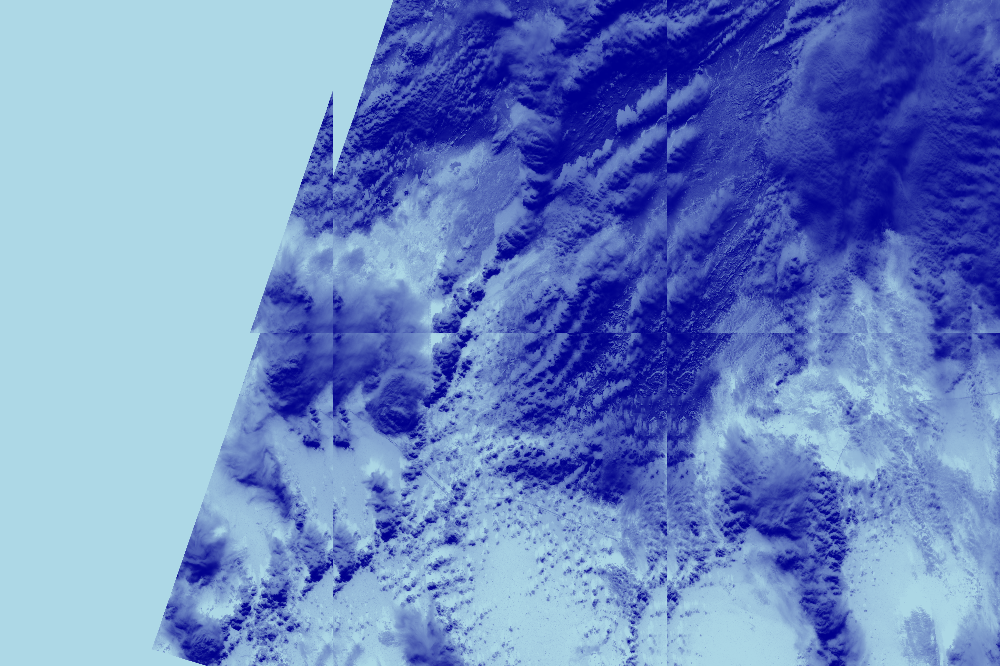

In [251]:
shade(combined_01.compute())